# Playing Atari with Deep Reinforment Learning
#### The goal of the agent is to interact with the game by selecting actions s.t. maximises the (discounted) future rewards. 

    E[R_0]= r_{0}+ γ*r_{1}+ γˆ2*r_{2} …… = E[∑t=0->n γ^t * r_{t+1}]
    
Defining the optimal policy as among all available actions at the current state, then choose the action that maximizes the expectated total R: 

    Q*(s,a) = max(π) E[R_t |s_t=s, a_t=a, π]
if we assign the computation of successor states' reward R to some orcle V(s), now the expected value under optimal strategy following an important identity known as _Bellman equation_ becomes: 

    chooses a s.t. a = argmax(a') [E(r_t + γ*V(s_{t+1}))]



The basic idea behind reinformance learning algo is to estimate the action value function by using the _Bellman equation_ above as iterative upate to Q_{i+1}(s,a). And such value iteration will eventually converge to the optimal action value  function

Neural networks are universal function approximators, we can simply create one and train it to resemble Q.Combined with the _Bellman equaition_ introduced above, this will give us the expected state action value to be the immediate reward plus the discounted accumulated value of the sucessor states as: 

      Qπ (s,a) = r+ γ*Qπ (s′,π(s′))
      Q*(s,a) = E [r_t + γ*max(a')Q(s', a')|s, a]




In [ ]:
import gym
from gym import envs
from gym import wrappers

import math
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from collections import namedtuple
from itertools import count

import argparse
import logging
import sys

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable

from network.DQN import DQN
from network.deepnet import Net




# set up matplotlib
is_ipython = 'inline' in matplotlib.get_backend()
if is_ipython:
    from IPython import display

plt.ion()


In [ ]:
 
# if gpu is to be used
use_cuda = torch.cuda.is_available()
FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_cuda else torch.ByteTensor
DoubleTensor = torch.cuda.DoubleTensor if use_cuda else torch.DoubleTensor
Tensor = FloatTensor


config = {
            "frame_size_h": 9,
            "frame_size_w": 9,
            "frame_size_d": 3,
            "action_list_n": 81,#83,
            "EPS_START": 1,
            "EPS_END": 0.1,
            "EPS_DECAY": 200,
            "BATCH_SIZE": 32,
            "GAMMA": 0.999,     
            "learning_rate": 1e-4,
            "replay_memory_capacity": 10000,
            "n_itr" : 100
            
        }

config_net = {
            "inputs_dim": 9*9*3,
            "hidden_dim": 100,
            "outputs_dim": 81 #83
}


# named tuple representing a single transition in enviornment
Transition = namedtuple('Transition',
                        ('state', 'action', 'reward', 'next_state'))
epoch_durations = []
average_total_Q = []
average_total_reward = []
average_loss = []


In [ ]:

def plot_durations():
    fig = plt.figure(figsize=(5,16))
    plt.clf()
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    reward_t = average_total_reward
    q_t = average_total_Q
    loss_ = average_loss
    
    ax1.plot(reward_t)
    ax2.plot(q_t)
    ax3.plot(loss_)
    # Take 100 episode averages and plot them too
    #if len(durations_t) >= 100:
    #    means = durations_t.unfold(0, 100, 1).mean(1).view(-1)
    #    means = torch.cat((torch.zeros(99), means))
     #   plt.plot(means.numpy())
        
    ax1.set_title('REWARD - Training Go9x9-v0')
    ax2.set_title('Q VALUE - Training Go9x9-v0')
    ax3.set_title('LOSS - Training Go9x9-v0')
    ax1.set_xlabel('Epoch')
    ax2.set_xlabel('Epoch')
    ax3.set_xlabel('Epoch')
    ax1.set_ylabel('Average Reward per Epoch')
    ax2.set_ylabel('Average Action value(Q) oer Episode')
    ax3.set_ylabel('Average Loss per Episode')
    
    ax2.set_ylim([0,0.3])

    plt.pause(0.001)  # pause a bit so that plots are updated
    if is_ipython:
        display.clear_output(wait=True)
        display.display(plt.gcf())


class ReplayMemory(object):

    def __init__(self, capacity):
        self.capacity = capacity
        self.memory =[]
        self.position = 0

    def save(self, *args):      # save a trasition
        if len(self.memory) < self.capacity:
            self.memory.append(None)
        self.memory[self.position]=Transition(*args)
        self.position= (self.position+1) % self.capacity


    def sample(self, batch_size):       # select random batch of transitions from memory
        return random.sample(self.memory, batch_size)


    def __len__(self):
        return len(self.memory)



In [ ]:
class QLearningAgent(object):
    """
    Agent implementing Deep Q-learning with experience replay
    """

    def __init__(self, observation_space, action_space, learnable=None, replay_memory_capacity=None):
        self.observation_space = observation_space
        self.action_space = action_space
        self.learnable = learnable
        self.epoch_done = 0

        #// initialize replay memory D to capacity N
        self.replay_memory = ReplayMemory(replay_memory_capacity if replay_memory_capacity is not None else config["replay_memory_capacity"])

        #// initialize Q network

        if self.learnable is not None:
            self.q = DQN(config["frame_size_h"], config["frame_size_w"], \
                         config["action_list_n"]) if self.learnable=='DQN' \
                    else \
                    Net(config_net["inputs_dim"], \
                        config["action_list_n"], config_net["hidden_dim"])
            
            self.q.float()           
            #self.optimizer = optim.RMSprop(self.q.parameters())
            self.loss = torch.nn.MSELoss()
            self.optimizer = optim.SGD(self.q.parameters(), lr=config["learning_rate"], momentum=0.9, weight_decay=0.0001)
            
        else:
            self.q = None
            
        
        
    def act_random(self):
        action = self.action_space.sample()
        #while action > config["action_list_n"]-1:
        #    action = self.action_space.sample()     # cap only for go game 
        return action, 0    


    #  Epsilon greedy control off-policy strategy
    def act_learn(self, observation, eps=None):
        """
        Args: 
            observation[DoubleTensor]: shape 3,9,9
        Return: 
            action[int64] : action picked
            value[float]: estimated Q value of corresponding action picked
        """
        
        if eps is None:
            eps= config["EPS_END"] + (config["EPS_START"]-config["EPS_END"]) * \
                math.exp(-1. *  self.epoch_done / config["EPS_DECAY"])

        # Compute Q-values for each action
        # pick the action that maximizes Q or random action 
        observation = observation.view(config_net["inputs_dim"]) if self.learnable=='DQN' \
                     else observation.view(1, config_net["inputs_dim"])
        qvalue_list = self.q(Variable(observation, volatile=True).type(FloatTensor)).data  
        
        if np.random.random() > eps:
            qvalue, action = torch.max(qvalue_list, 1)
            action = action.numpy()[0][0]   #from tensor 
            qvalue = qvalue.numpy()[0][0]
        else: 
            action, _ = self.act_random()
            qvalue = qvalue_list[0][action]
            
        #if action > 80:
        #    raise Exception("get action:" + str(action))       # cap for go game 
            
        return action, qvalue



    def train(self, env):
        self.epoch_done=0
        reward_total=0.
        for i in range(config["n_itr"]):
            print('')
            print(' =============================> Epoch ' + str(self.epoch_done))

            obs = env.reset()          
            qvalue_total=0.
            loss_total=0.

            for t in count():
                print(' episode: ' + str(t+1))
                
                # Select and perform the action
                action, qvalue = self.act_random() if self.q is None else self.act_learn(torch.from_numpy(obs))
                #print "take action: "
                #print action
                obs2, reward, done, info = env.step(action)               
                print (action, qvalue, reward, done)

                # Store transition into memory
                if done: 
                    obs2 = None
                self.replay_memory.save(obs ,action, reward, obs2)
                
                
                # Perform on step of optimization to Q net
                if self.q is not None:
                    loss_data_ = self.optimize_model()
                else :
                    loss_data_ = 0.0
                    
                reward_total += reward
                qvalue_total += qvalue
                loss_total += loss_data_
                obs = obs2 

                if done:
                    #print 'You win!' if reward > 0 else 'Opponent wins!'
                    average_total_reward.append(reward_total/(self.epoch_done+1))
                    average_total_Q.append(qvalue_total/(t+1))
                    average_loss.append(loss_total/(t+1))
                    epoch_durations.append(t+1)
                    plot_durations()
                    break


            self.epoch_done += 1

        print('Complete')
        env.render(close=True)
        env.close()
        plt.ioff()
        #plt.show()


    def optimize_model(self):

        BATCH_SIZE = config["BATCH_SIZE"]
        ACTION_LIST = config["action_list_n"]
        INPUT_SIZE = config_net["inputs_dim"]
        if len(self.replay_memory) < BATCH_SIZE:
            return 0.0

        transitions = self.replay_memory.sample(BATCH_SIZE)

        batch = Transition(*zip(*transitions))
        print ('sample batch from memory...\n')
        
        

        # Concatenate the batch elements of each
        # state, action , reward in every transition
        state_batch = Variable(torch.from_numpy(np.asarray(batch.state))).float()    ##.double()
        action_batch = Variable(torch.from_numpy(np.asarray(batch.action))).float() ##.double()
        reward_batch = Variable(torch.from_numpy(np.asarray(batch.reward))).float()  ##.double()


        # Compute Q(s_t, a) by model
        # the model computes Q(s_t) and we select the columns
        # of actions taken in record
        state_values_ = self.q(\
                    state_batch if self.learnable=='DQN' else state_batch.view(-1,INPUT_SIZE)\
                    )
        state_action_values = state_values_[0].view(1,ACTION_LIST).index_select(1, action_batch[0].long())
        for i in range(len(action_batch)-1):
            state_action_values = torch.cat((state_action_values, \
                                    state_values_[i+1].view(1,ACTION_LIST).index_select(1, action_batch[i+1].long())),0)
        state_action_values = state_action_values.index_select(1, Variable(torch.LongTensor([0])))
        
        
        ##############
        print (" Q(s_{t}, a): ") #+ str(state_action_values))
        ##############


        non_final_mask = ByteTensor(tuple(map(lambda s: s is not None,\
                                             batch.next_state)))
        # We don't want backprop expected action values, volatile shuts down requires-grad
        non_final_next_states = Variable (torch.cat([torch.from_numpy(x) for x in np.asarray(batch.state) \
                                           if x is not None]), volatile=True).float()        ##.double()


        # Compute state value V(s_{t+1}) by model for all next states,
        # then select the maxQ value of each:
        #
        ## MAX(a)Q(s_{t+1}, a)
        next_state_values = Variable(torch.zeros(BATCH_SIZE).type(Tensor)).float()       ##.double()
        next_state_values[non_final_mask], _ = torch.max( self.q( \
            non_final_next_states if self.learnable=='DQN' \
                    else non_final_next_states.view(-1,INPUT_SIZE) \
            ), 1)   
        
        #############
        print("V(s_{t+1}): ") #+ str(next_state_values))
        ############

        # Compute the expected Q values
        #
        ## Bellman equation
        ## Q_{t+1}(s,a) = r + gamma * MAX(a')Q(s', a')
        expected_state_action_values = (next_state_values * config["GAMMA"]) + reward_batch


        # Compute Mean-Square Error loss from Q and expected Q*
        #
        ## loss(x, y) = 1/n sum|x-y|^2
        loss = self.loss(state_action_values, expected_state_action_values)
        ##############
        print("LOSS: " + str(loss))
        ################
        
        # Optimize model
        self.optimizer.zero_grad()
        loss.backward()
        
        return loss.data.numpy()[0]


        
        




The algorithm follows off-policy but epsilon controlled greedy strategy, where there is a probaility of epsilon value that action selected by the model (with the estimated max Q value) and select random action with proablity (1-epsilon).


During training, after each episode of interaction with the game enviornment (collect reward, and the next state by taking some action), we will push a transition T = { s_{t}, reward, action, s_{t+1} } to the _replay memory D_ and we sample a batch of transitions from memory when we optimize our network and compute the following:

- the **state action value** estimated by model Q (s_t, a_t),  
- the **expected action state value** y_i (also the target/label) estimated by model max(a')[Q(s',a')|s,a], with Bellman equation this giving us: 

        y_i = Es'->end[ r + gamma * max(a')Q(s',a')|s, a ]
        
  note that in terminal state where V(s)=0, here Q(s_{t-1}, a) = rt


Loss is applied on the differece of predicted and expected by mean square error loss function in the preliminary experiments. 

### Results On LunarLander-v2 Game

Reward for moving from the top of the screen to landing pad at coordinate [0,0] and zero speed is about 100..140 points.

Four actions: 
- Do nothing 
- Fire left orientation engine
- Fire main engine 
- Fire right orientation engine

Episode finishes if the lander crashes or comes to rest, receiving additional -100 or +100 points. Each leg ground contact is +10. Firing main engine is -0.3 points each frame. Solved is 200 points.

In [ ]:
config['action_list_n'] = 4
config_net['outputs_dim']  = 4
config_net['inputs_dim']  = 8

#env_ = gym.make('Taxi-v2')
env_ = gym.make('LunarLander-v2')
random_agent = QLearningAgent(env_.observation_space, env_.action_space)
random_agent.train(env_)


In [14]:


env_ = gym.make('LunarLander-v2')
random_agent = QLearningAgent(env_.observation_space, env_.action_space, learnable="deepNet")
random_agent.train(env_)


NameError: name 'envs' is not defined

### Results On Go9x9-v0 Board game
#### Playing with random agent 

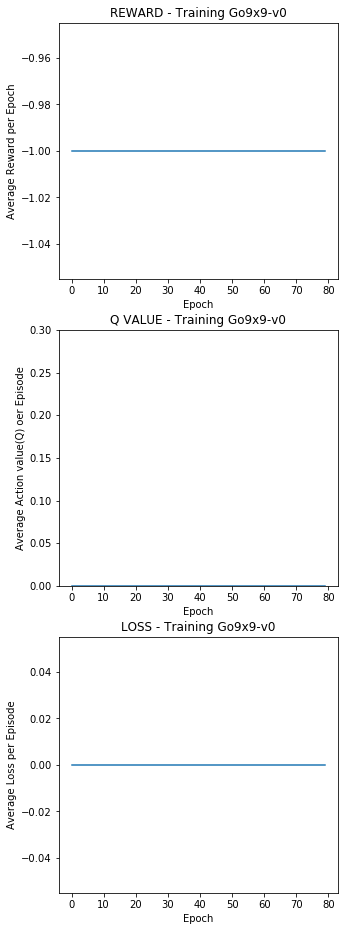


 =============================> Epoch 80
 episode: 1


KeyboardInterrupt: 

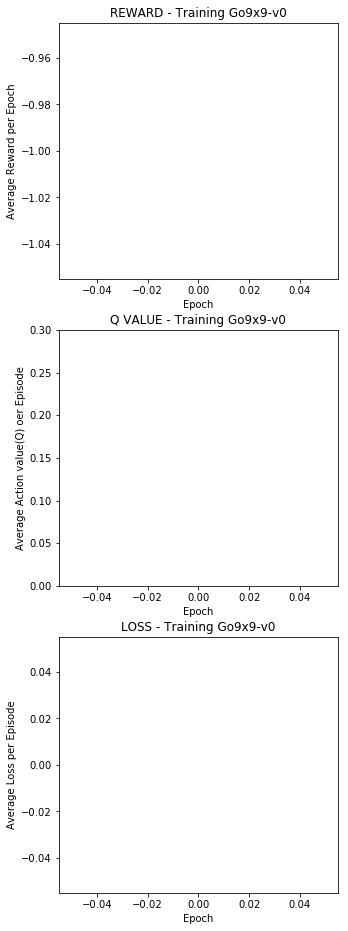

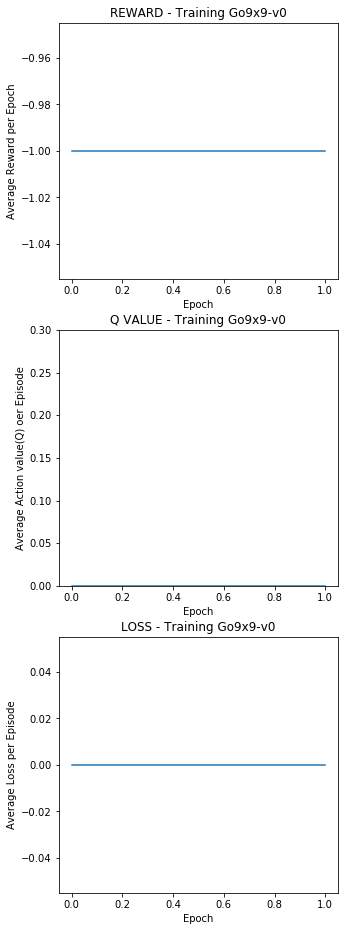

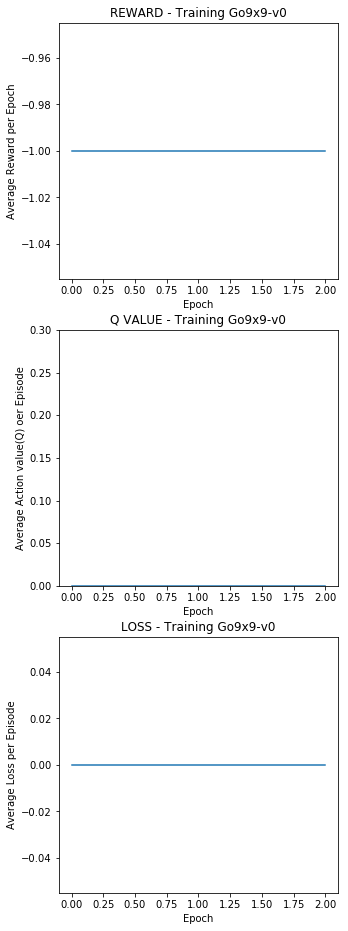

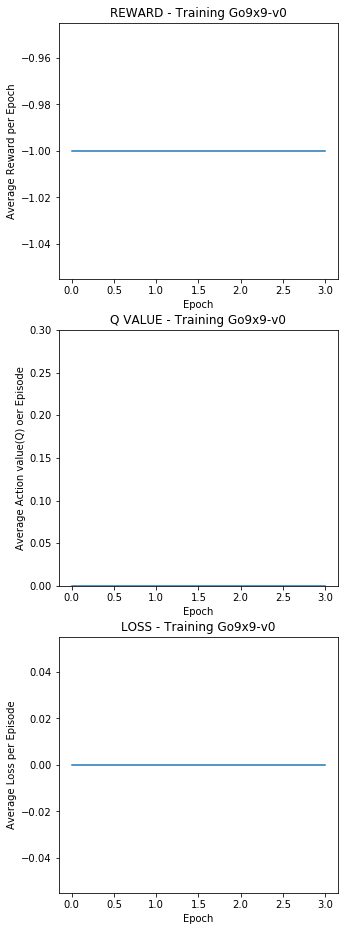

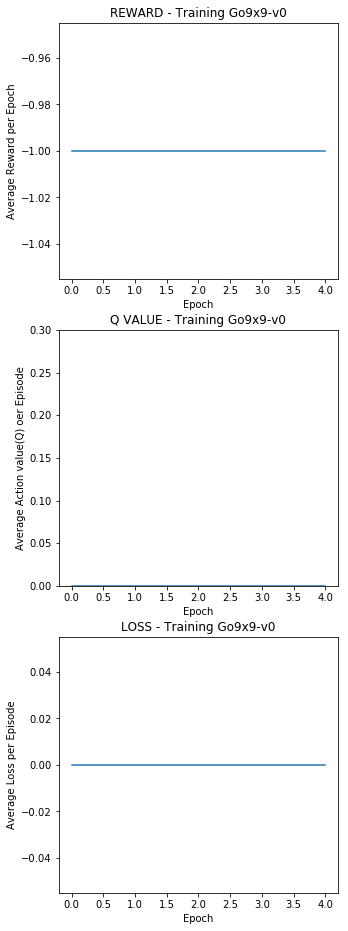

...

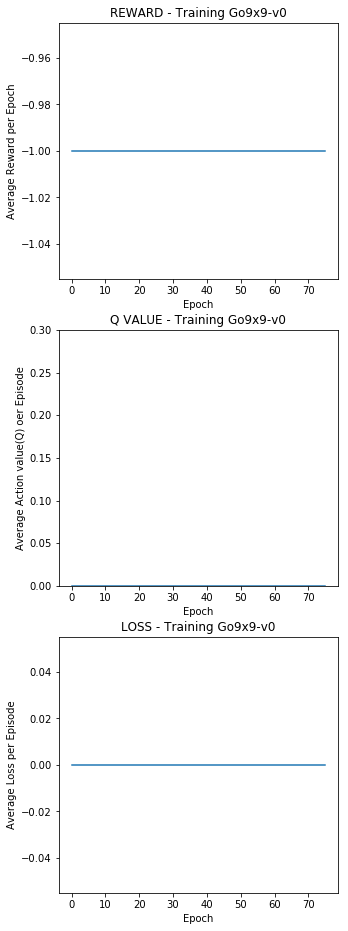

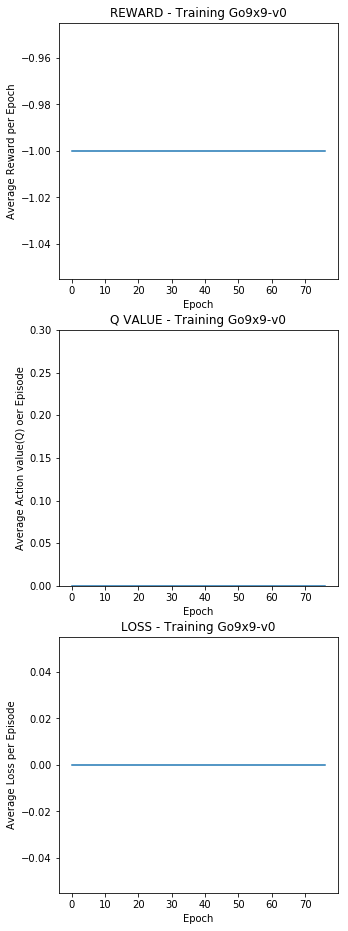

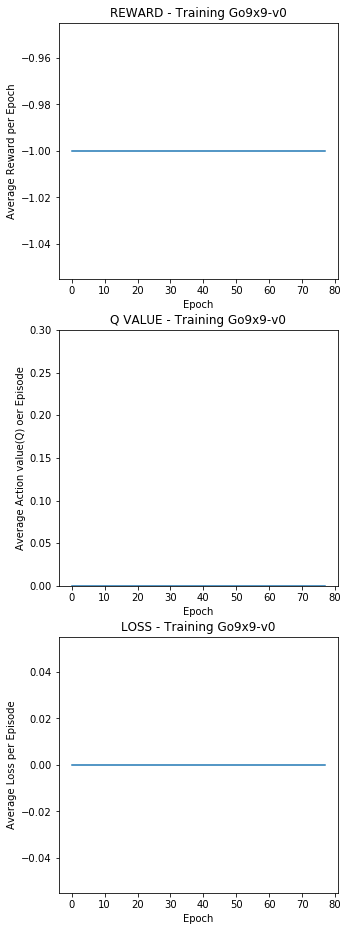

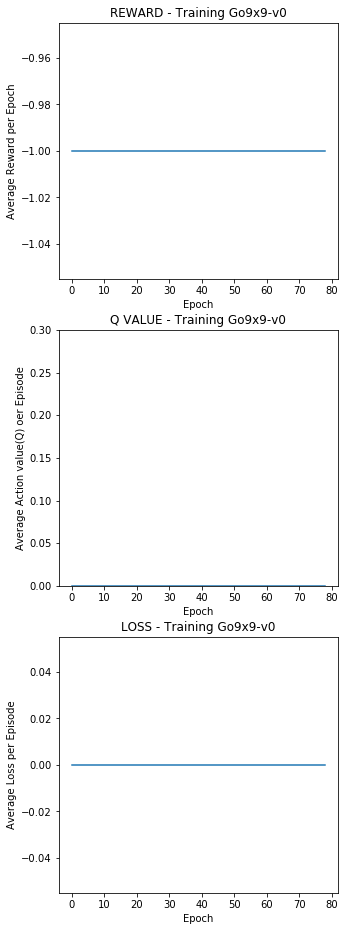

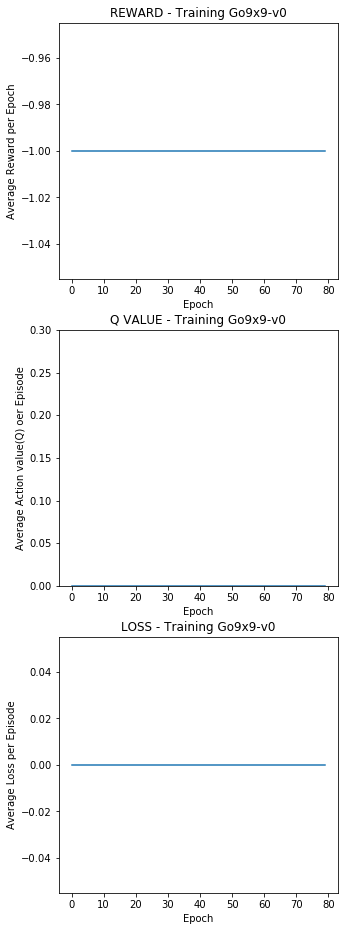

In [15]:
#print(envs.registry.all())
env = gym.make('Go9x9-v0')
random_agent = QLearningAgent(env.observation_space, env.action_space)
random_agent.train(env)





#### Playing with Deep Q-learning agent

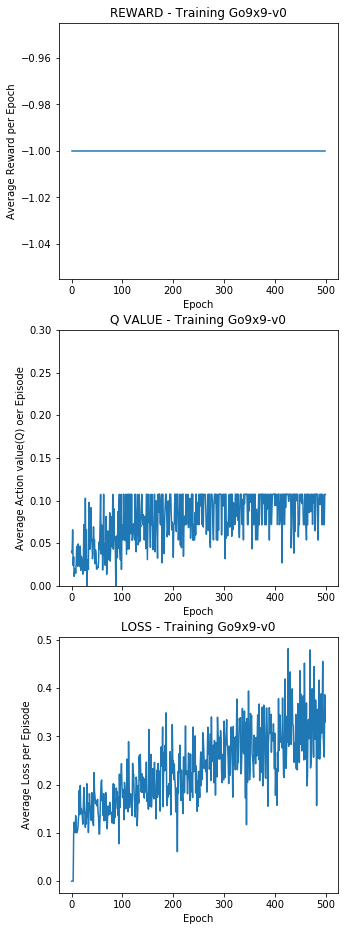

Complete


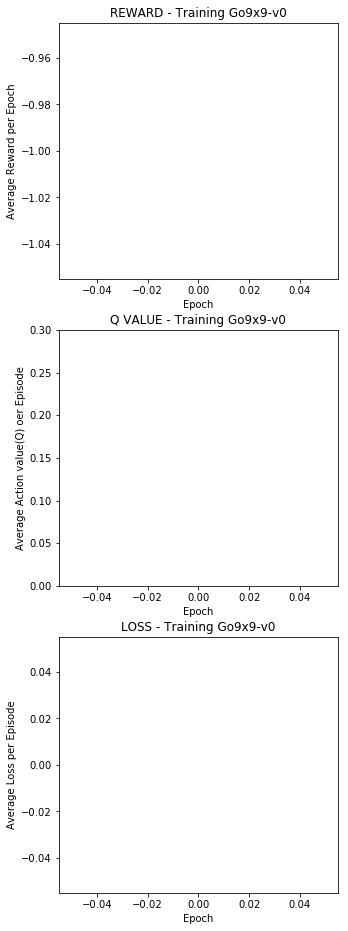

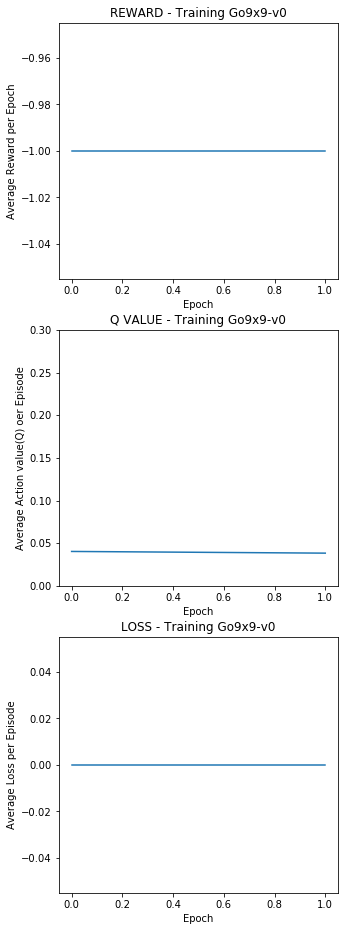

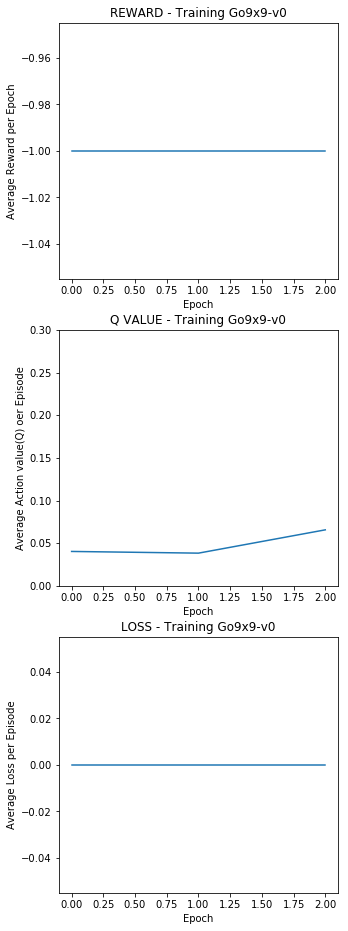

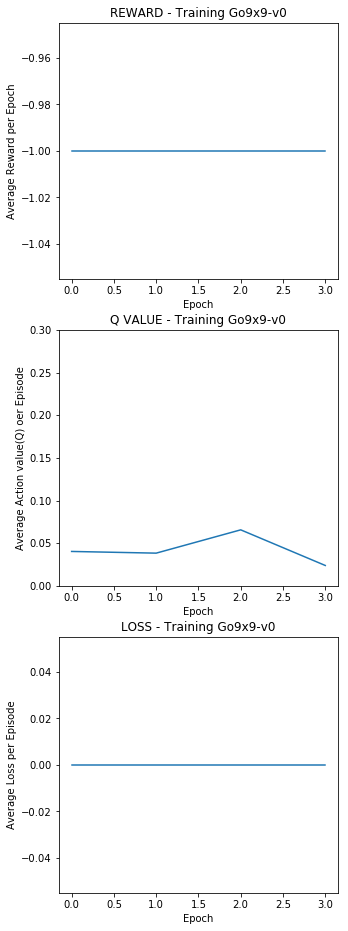

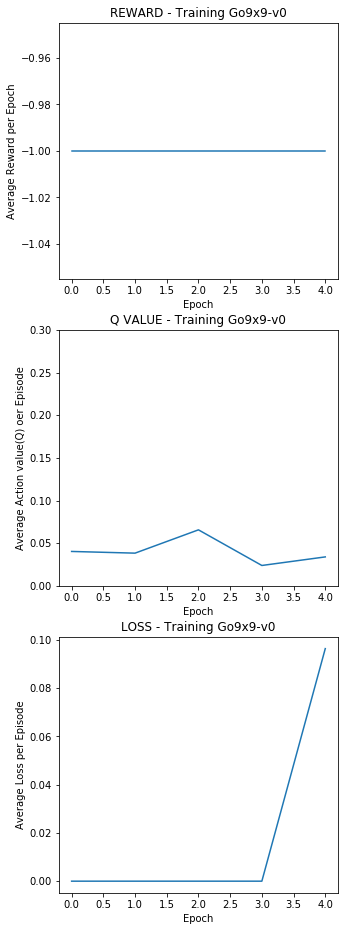

...

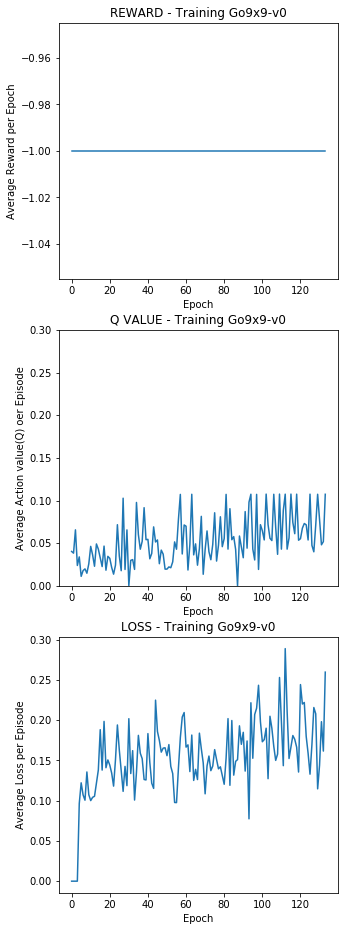

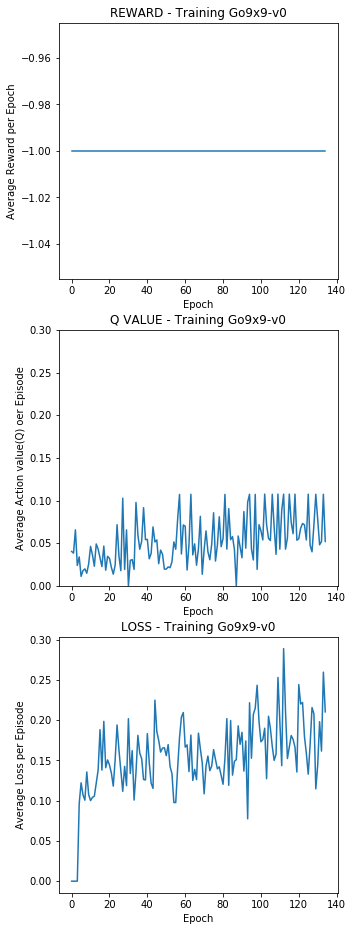

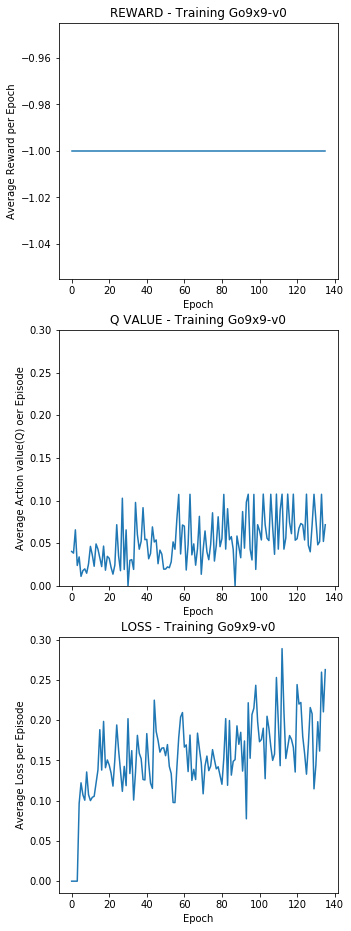

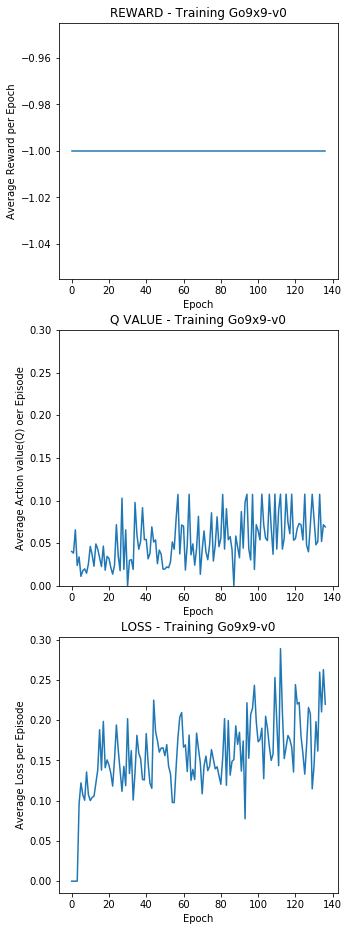

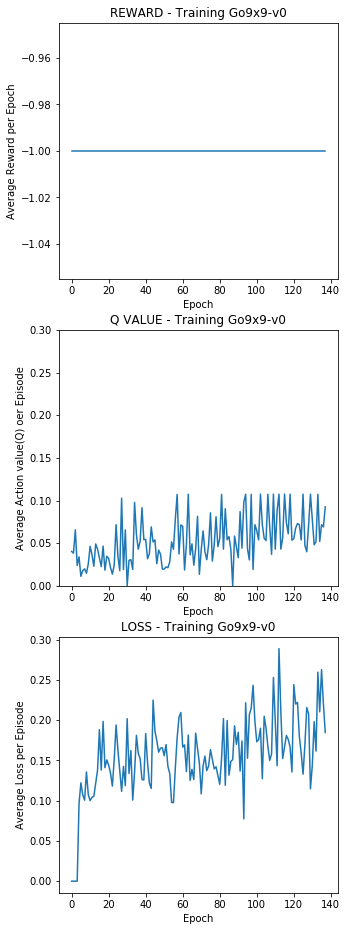

[2017-11-02 09:52:52,851] Uncaught exception, closing connection.
Traceback (most recent call last):
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 235, in dispatch_shell
    handler(stream, idents, msg)
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/Users/sunceli/anaconda/lib/python2.7/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store

In [ ]:
env = gym.make('Go9x9-v0')
print env.action_space.n
print env.observation_space

Qagent = QLearningAgent(env.observation_space, env.action_space, learnable='deepNet')
Qagent.train(env)

In [ ]:
env = gym.make('Go9x9-v0')
print env.action_space.n
print env.observation_space

Qagent = QLearningAgent(env.observation_space, env.action_space, learnable="deepNet")
Qagent.train(env)

In [ ]:
import torchvision.transforms as T
from PIL import Image
resize = T.Compose([T.ToPILImage(),
                    T.Scale(40, interpolation=Image.CUBIC),
                    T.ToTensor()])
#env = gym.make('Go9x9-v0')
#env.reset()
#env.step(13)
inputs = np.random.randn(50,50,1).astype('double')
#inputs = inputs.astype('float64')
inputs = Variable(torch.from_numpy(inputs))
#resize(inputs.data).unsqueeze(0)


In [ ]:
x = Variable(torch.randn(5,1)).double()
print x
#indices = Variable(torch.LongTensor([0]))
#x = torch.index_select(x, 1, indices)
#print x
a, i = torch.max(x, 0)
print a
print i
print type(i.data.numpy()[0][0])
print type(a.data.numpy()[0][0])